**Importing the required Libraries**

In [1]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from math import log

**Dataset Download**

In [2]:
urlFacebookNetwork = 'https://snap.stanford.edu/data/facebook_combined.txt.gz'
urlEmailNetwork = 'https://snap.stanford.edu/data/email-Eu-core.txt.gz'

In [3]:
dataframeFacebookNetwork = pd.read_csv(urlFacebookNetwork, delimiter=' ', header=None, names=['from', 'to'])
dataframeEmailNetwork = pd.read_csv(urlEmailNetwork, delimiter=' ', header=None, names=['from', 'to'])

In [4]:
facebookNetwork = nx.from_pandas_edgelist(dataframeFacebookNetwork, 'from', 'to')
facebookNetwork.name = 'Facebook Network'
emailNetwork = nx.from_pandas_edgelist(dataframeEmailNetwork, 'from', 'to', create_using=nx.DiGraph())
emailNetwork.name = 'E-mail Network'

**Information about the Networks**

In [5]:
print(nx.info(facebookNetwork))
print()
print(nx.info(emailNetwork))

Name: Facebook Network
Type: Graph
Number of nodes: 4039
Number of edges: 88234
Average degree:  43.6910

Name: E-mail Network
Type: DiGraph
Number of nodes: 1005
Number of edges: 25571
Average in degree:  25.4438
Average out degree:  25.4438


**Networks**

Facebook Network

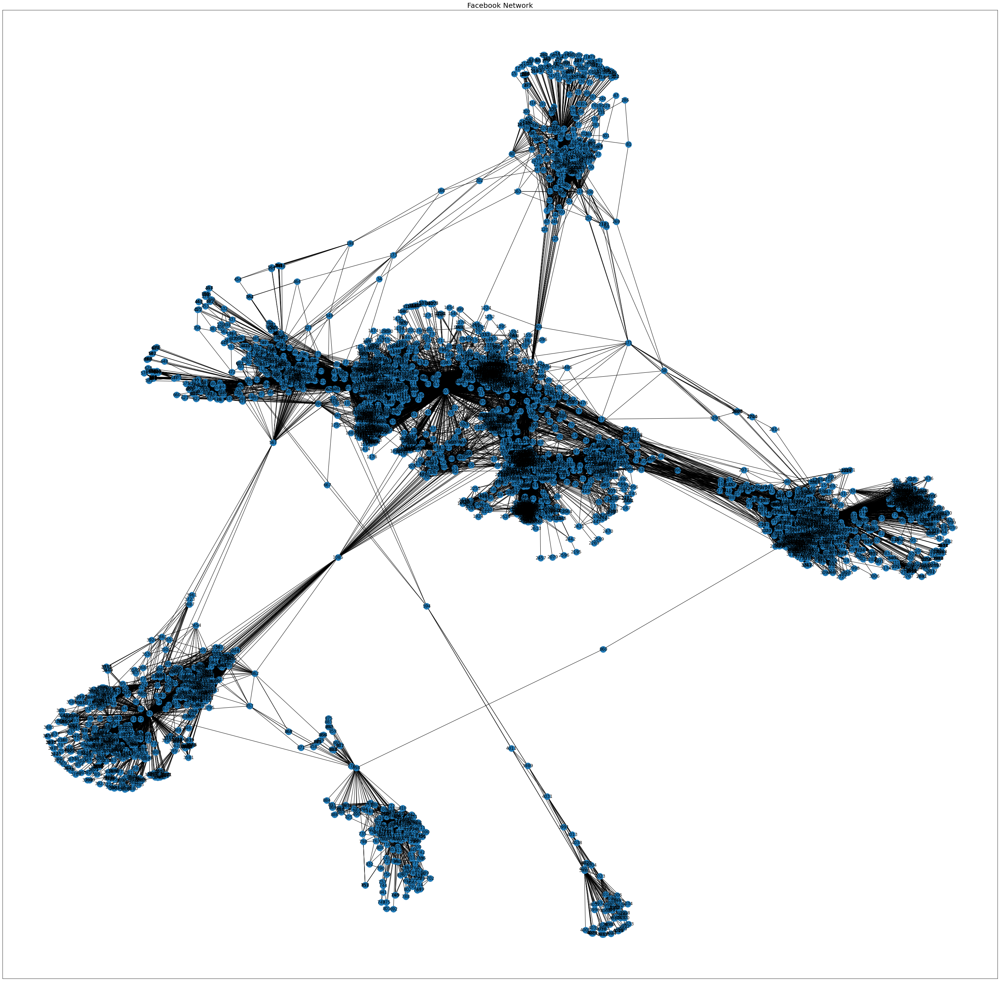

In [6]:
plt.figure(figsize=(50, 50))
plt.title('Facebook Network', fontsize=20)
nx.draw_networkx(facebookNetwork, pos=nx.spring_layout(facebookNetwork))

Email Network

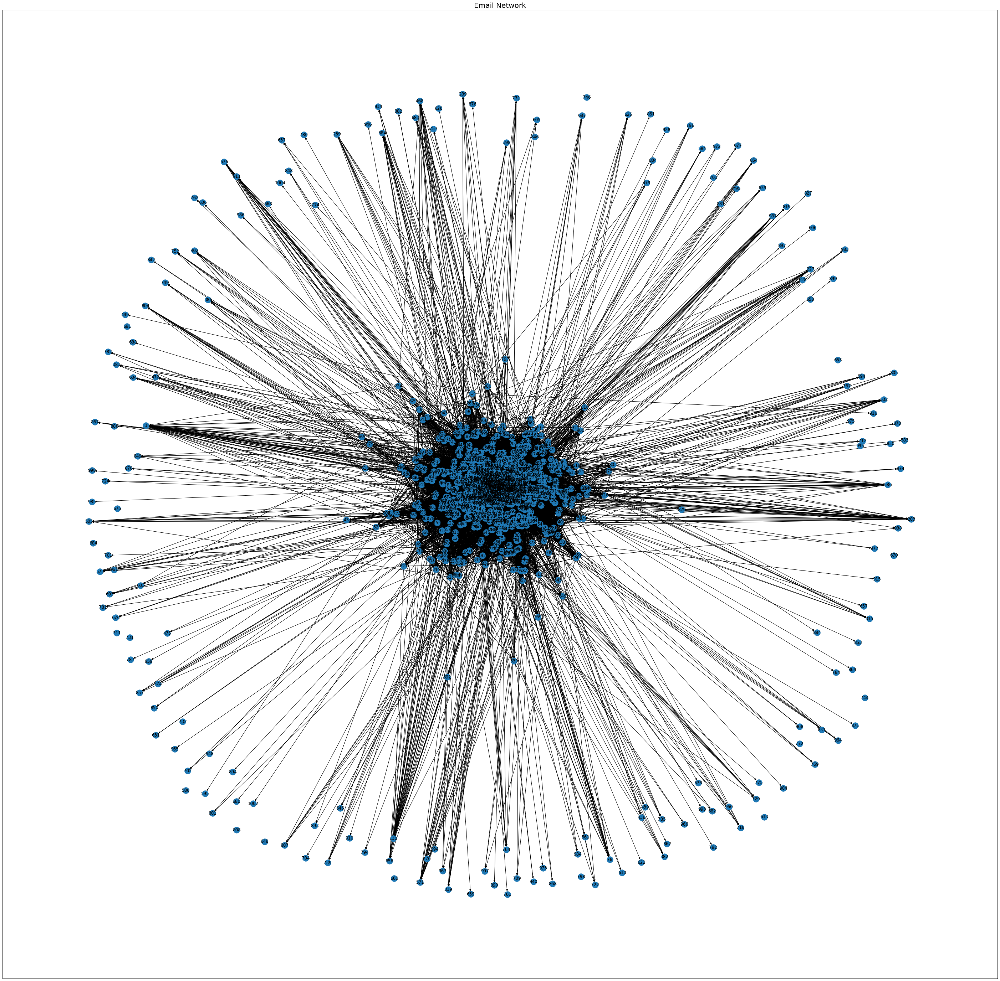

In [7]:
plt.figure(figsize=(50, 50))
plt.title('Email Network', fontsize=20)
nx.draw_networkx(emailNetwork, pos=nx.spring_layout(emailNetwork))

**Centrality Measures**

Degree Centrality

In [8]:
degCentralityFacebookNetwork = nx.degree_centrality(facebookNetwork)
pd.DataFrame(sorted(degCentralityFacebookNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'degreeCentrality'])

,Node,degreeCentrality
0,107,0.258791
1,1684,0.196137
2,1912,0.186974
3,3437,0.135463
4,0,0.085934
...,...,...
4034,4010,0.000248
4035,4015,0.000248
4036,4022,0.000248
4037,4024,0.000248


In [9]:
inDegCentralityEmailNetwork = nx.in_degree_centrality(emailNetwork)
pd.DataFrame(sorted(inDegCentralityEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'inDegreeCentrality'])

,Node,inDegreeCentrality
0,160,0.211155
1,62,0.178287
2,107,0.168327
3,121,0.156375
4,86,0.153386
...,...,...
1000,941,0.000000
1001,943,0.000000
1002,944,0.000000
1003,982,0.000000


In [10]:
outDegCentralityEmailNetwork = nx.out_degree_centrality(emailNetwork)
pd.DataFrame(sorted(outDegCentralityEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'outDegreeCentrality'])

,Node,outDegreeCentrality
0,160,0.332669
1,82,0.226096
2,121,0.221116
3,107,0.203187
4,86,0.201195
...,...,...
1000,994,0.000000
1001,997,0.000000
1002,998,0.000000
1003,1002,0.000000


EigenVector Centrality

In [11]:
evCentralityFaceBookNetwork = nx.eigenvector_centrality(facebookNetwork)
pd.DataFrame(sorted(evCentralityFaceBookNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'eigenvectorCentrality'])

,Node,eigenvectorCentrality
0,1912,9.540696e-02
1,2266,8.698328e-02
2,2206,8.605239e-02
3,2233,8.517341e-02
4,2464,8.427877e-02
...,...,...
4034,841,6.446055e-14
4035,749,6.433195e-14
4036,775,6.433195e-14
4037,692,6.385265e-14


In [12]:
evCentralityEmailNetwork = nx.eigenvector_centrality(emailNetwork)
pd.DataFrame(sorted(evCentralityEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'eigenvectorCentrality'])

,Node,eigenvectorCentrality
0,160,1.492083e-01
1,107,1.436550e-01
2,62,1.400842e-01
3,434,1.360606e-01
4,121,1.360243e-01
...,...,...
1000,941,1.225420e-23
1001,943,1.225420e-23
1002,944,1.225420e-23
1003,982,1.225420e-23


Katz Centrality

In [13]:
katzCentralityFacebookNetwork = nx.katz_centrality_numpy(facebookNetwork)
pd.DataFrame(sorted(katzCentralityFacebookNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'katzCentrality'])

,Node,katzCentrality
0,2696,0.106398
1,2921,0.099801
2,2934,0.094739
3,3275,0.085035
4,2870,0.083750
...,...,...
4034,2936,-0.077398
4035,2793,-0.079281
4036,2715,-0.083322
4037,3005,-0.088915


In [14]:
katzCentralityEmailNetwork = nx.katz_centrality_numpy(emailNetwork)
pd.DataFrame(sorted(katzCentralityEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'katzCentrality'])

,Node,katzCentrality
0,84,0.172710
1,433,0.160415
2,71,0.146416
3,50,0.123141
4,288,0.112618
...,...,...
1000,482,-0.095121
1001,107,-0.095395
1002,62,-0.098299
1003,340,-0.100809


PageRank Centrality

In [15]:
pagerankCentralityFacebookNetwork = nx.pagerank(facebookNetwork) 
pd.DataFrame(sorted(pagerankCentralityFacebookNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'pagerankCentrality'])

,Node,pagerankCentrality
0,3437,0.007615
1,107,0.006936
2,1684,0.006367
3,0,0.006290
4,1912,0.003877
...,...,...
4034,2269,0.000042
4035,2457,0.000042
4036,2470,0.000042
4037,2569,0.000042


In [16]:
pagerankCentralityEmailNetwork = nx.pagerank(emailNetwork) 
pd.DataFrame(sorted(pagerankCentralityEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'pagerankCentrality'])

,Node,pagerankCentrality
0,1,0.009412
1,130,0.006914
2,160,0.006759
3,62,0.005322
4,86,0.005130
...,...,...
1000,941,0.000183
1001,943,0.000183
1002,944,0.000183
1003,982,0.000183


Closeness Centrality

In [17]:
closenessCentralityFacebookNetwork = nx.closeness_centrality(facebookNetwork)
pd.DataFrame(sorted(closenessCentralityFacebookNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'closenessCentrality'])

,Node,closenessCentrality
0,107,0.459699
1,58,0.397402
2,428,0.394837
3,563,0.393913
4,1684,0.393606
...,...,...
4034,750,0.178262
4035,775,0.178262
4036,841,0.178262
4037,692,0.178255


In [18]:
closenessCentralityEmailNetwork = nx.closeness_centrality(emailNetwork)
pd.DataFrame(sorted(closenessCentralityEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'closenessCentrality'])

,Node,closenessCentrality
0,160,0.449669
1,62,0.436796
2,107,0.433133
3,434,0.428434
4,121,0.427615
...,...,...
1000,944,0.000000
1001,979,0.000000
1002,982,0.000000
1003,992,0.000000


Betweenness Centrality

In [19]:
betweennessCentralityFacebookNetwork = nx.betweenness_centrality(facebookNetwork)
pd.DataFrame(sorted(betweennessCentralityFacebookNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'betweennessCentrality'])

,Node,betweennessCentrality
0,107,0.480518
1,1684,0.337797
2,3437,0.236115
3,1912,0.229295
4,1085,0.149015
...,...,...
4034,4032,0.000000
4035,4033,0.000000
4036,4034,0.000000
4037,4035,0.000000


In [20]:
betweennessCentralityEmailNetwork = nx.betweenness_centrality(emailNetwork)
pd.DataFrame(sorted(betweennessCentralityEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'betweennessCentrality'])

,Node,betweennessCentrality
0,160,0.072121
1,86,0.037433
2,5,0.026985
3,121,0.024532
4,62,0.024511
...,...,...
1000,998,0.000000
1001,999,0.000000
1002,1002,0.000000
1003,1003,0.000000


**Local Clustering Coefficients**

In [21]:
localClusteringCoefficientsFacebookNetwork = nx.clustering(facebookNetwork)
pd.DataFrame(sorted(localClusteringCoefficientsFacebookNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'localClusteringCoefficients'])

,Node,localClusteringCoefficients
0,32,1.0
1,33,1.0
2,35,1.0
3,42,1.0
4,44,1.0
...,...,...
4034,4010,0.0
4035,4015,0.0
4036,4022,0.0
4037,4024,0.0


In [22]:
localClusteringCoefficientsEmailNetwork = nx.clustering(emailNetwork)
pd.DataFrame(sorted(localClusteringCoefficientsEmailNetwork.items(), key=lambda item: item[1], reverse=True), columns=['Node', 'localClusteringCoefficients'])

,Node,localClusteringCoefficients
0,382,1.0
1,383,1.0
2,398,1.0
3,439,1.0
4,456,1.0
...,...,...
1000,998,0.0
1001,999,0.0
1002,1002,0.0
1003,1003,0.0


**Average Clustering Coefficient**

In [23]:
averageClusteringCoefficientFacebookNetwork = nx.average_clustering(facebookNetwork)
averageClusteringCoefficientFacebookNetwork

0.6055467186200876

In [24]:
averageClusteringCoefficientEmailNetwork = nx.average_clustering(emailNetwork)
averageClusteringCoefficientEmailNetwork

0.3656613629131559

**Transitivity/ Global Clustering Coefficient**

In [25]:
transitivityFacebookNetwork = nx.transitivity(facebookNetwork)
transitivityFacebookNetwork

0.5191742775433075

In [26]:
transitivityEmailNetwork = nx.transitivity(emailNetwork)
transitivityEmailNetwork

0.2201493109315837

**Reciprocity**

In [27]:
reciprocityFacebookNetwork = nx.reciprocity(facebookNetwork)
reciprocityFacebookNetwork

0.0

In [28]:
reciprocityEmailNetwork = nx.reciprocity(emailNetwork)
reciprocityEmailNetwork

0.6933635759258535

**Giant Components**

Giant Component of Facebook Network

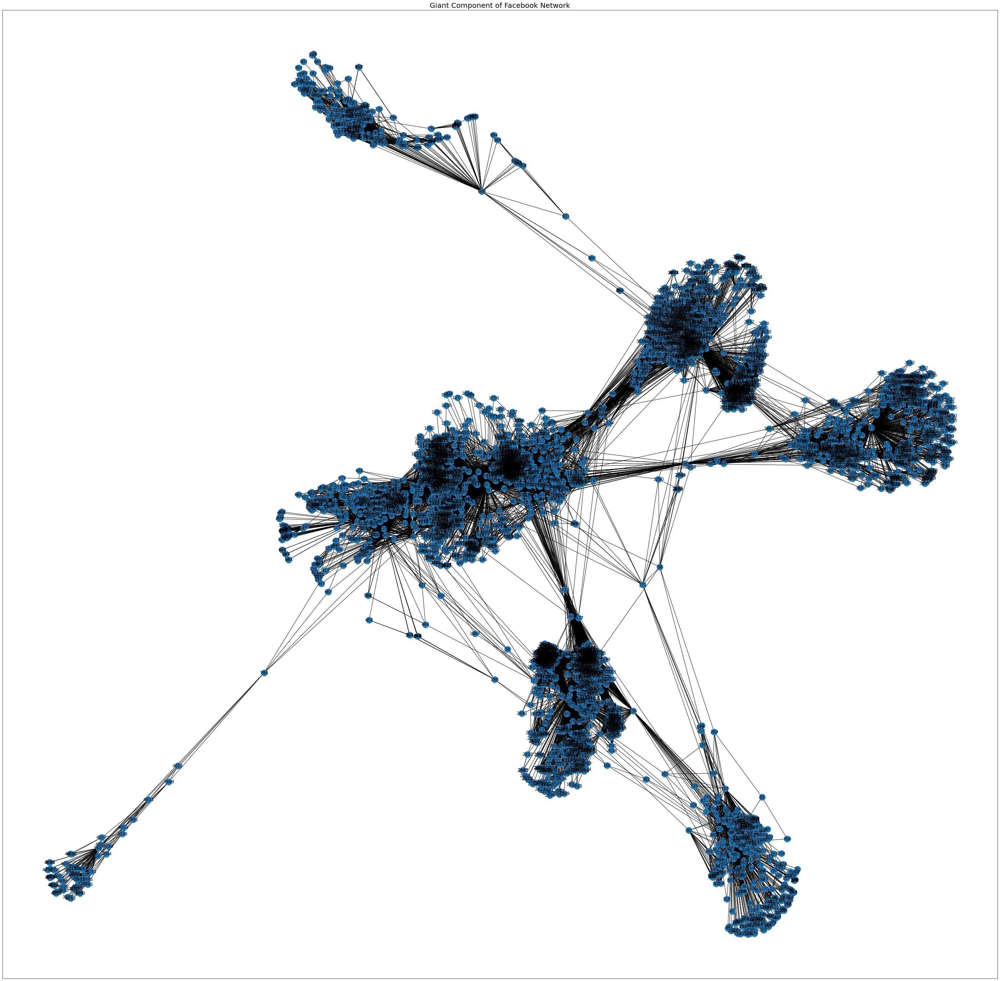

In [29]:
plt.figure(figsize=(50, 50))
plt.title('Giant Component of Facebook Network', fontsize=20)
giantFacebookNetwork = facebookNetwork.subgraph(max(nx.connected_components(facebookNetwork), key=len))
nx.draw_networkx(facebookNetwork, pos=nx.spring_layout(facebookNetwork), edgelist=giantFacebookNetwork.edges())

In [30]:
giantFacebookNetwork.number_of_nodes()

4039

Giant Component of Email Network

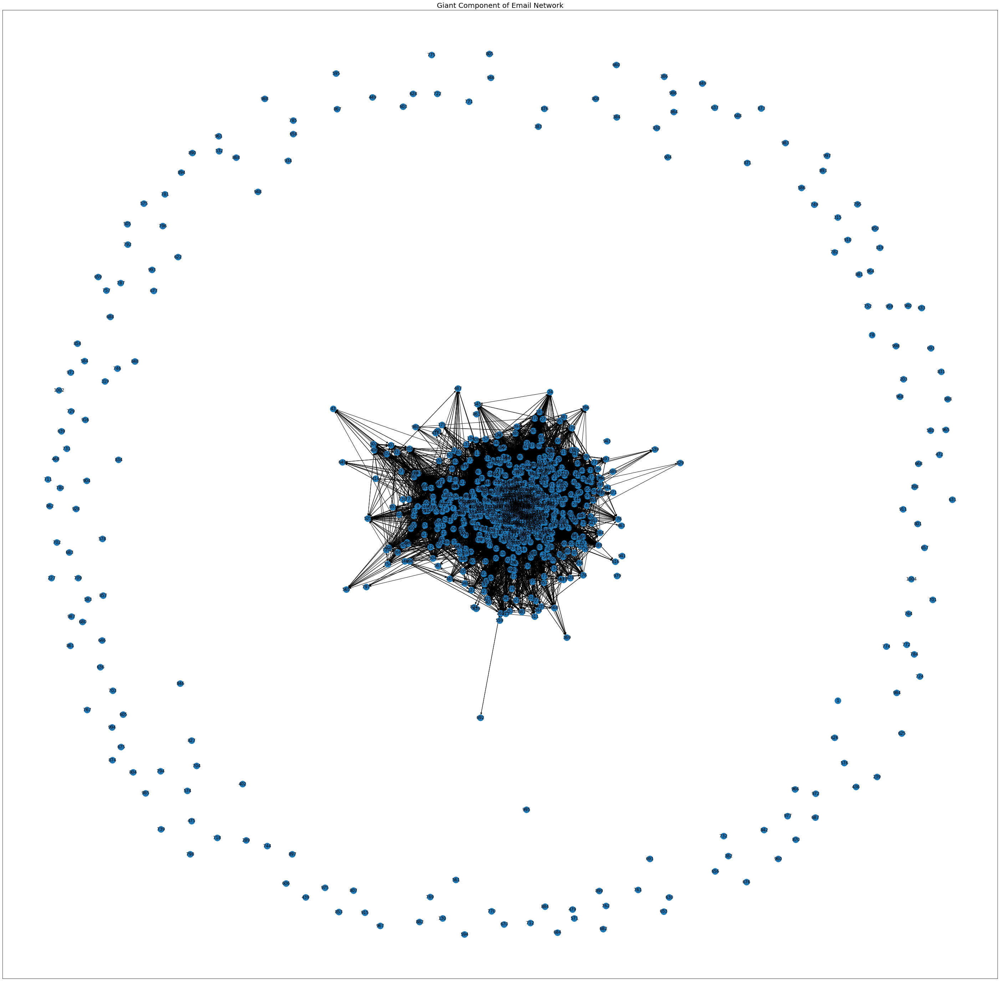

In [31]:
plt.figure(figsize=(50, 50))
plt.title('Giant Component of Email Network', fontsize=20)
giantEmailNetwork = emailNetwork.subgraph(max(nx.strongly_connected_components(emailNetwork), key=len))
nx.draw_networkx(emailNetwork, pos=nx.spring_layout(emailNetwork), edgelist=giantEmailNetwork.edges())

In [32]:
giantEmailNetwork.number_of_nodes()

803

**Evolution of Random Network**

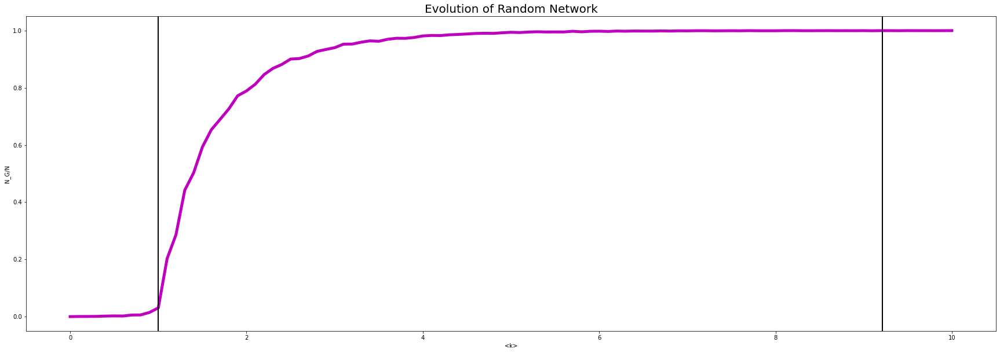

In [33]:
plt.figure(figsize=(30,10))
plt.title('Evolution of Random Network', fontsize=20)
nodes = 10000
averageDegree = np.arange(0, 10.1, 0.1)
probabilityK = []
for degree in averageDegree:
  randomNetwork = nx.erdos_renyi_graph(nodes, degree/(nodes-1))
  giantRandomNetwork = randomNetwork.subgraph(max(nx.connected_components(randomNetwork), key=len))
  probabilityK.append(giantRandomNetwork.number_of_nodes()/nodes)
plt.plot(averageDegree, probabilityK, 'm', linewidth=5)
plt.axvline(x=1, color='k', linewidth=2)
plt.axvline(x=log(nodes), color='k', linewidth=2)
plt.xlabel('<k>')
plt.ylabel('N_G/N')
plt.show()